## Data Visualisation

In [1]:
import math
import numpy as np
import pandas as pd
import scipy.stats as stats
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from scipy.stats import zscore
from pandas.plotting import scatter_matrix
from sklearn.preprocessing import LabelEncoder

df = pd.read_csv("./datasets/step1_output.csv")
image_dir = "plots/"

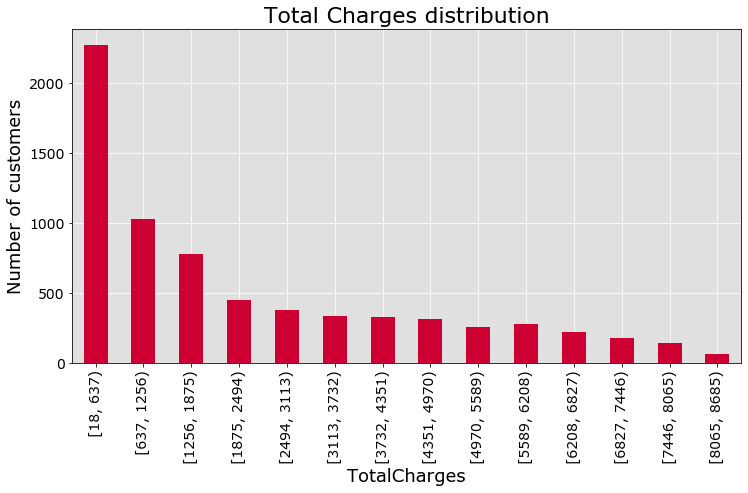

In [2]:
a, b=np.histogram(df['TotalCharges'],bins='sturges')
b=b.astype(int)
b[-1]=b[-1]+1


f = plt.figure(figsize=(12,8))
ax = f.add_subplot(1,1,1)
df.groupby(pd.cut(df['TotalCharges'], b, right=False)).count()['TotalCharges'].plot(kind='bar',color='#CC0033',figsize=(12,8),fontsize=14)
plt.title('Total Charges distribution', fontsize=22)
plt.ylabel('Number of customers',fontsize=18)
plt.xlabel('TotalCharges',fontsize=18)
plt.grid(color='white')
ax.set_facecolor('#E0E0E0')
ax.set_axisbelow(True)
f.subplots_adjust(bottom=0.3)

plt.savefig(image_dir+'total_charges.png')
plt.show()

In [3]:
df.head()

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,...,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn,color,ServiceCount
0,Female,0,Yes,No,1,No,No phone service,DSL,No,Yes,...,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No,blue,1
1,Male,0,No,No,34,Yes,No,DSL,Yes,No,...,No,No,One year,No,Mailed check,56.95,1889.50,No,blue,2
2,Male,0,No,No,2,Yes,No,DSL,Yes,Yes,...,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes,red,2
3,Male,0,No,No,45,No,No phone service,DSL,Yes,No,...,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No,blue,3
4,Female,0,No,No,2,Yes,No,Fiber optic,No,No,...,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes,red,0


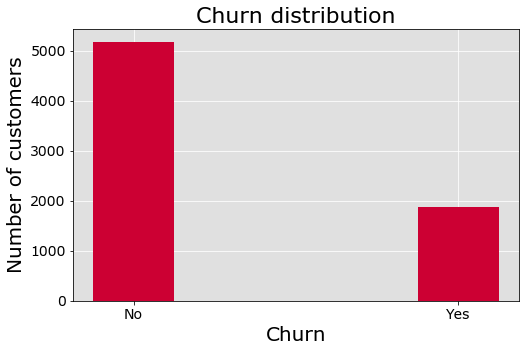

In [4]:
f = plt.figure(figsize=(8,5))
ax = f.add_subplot(1,1,1)
plt.bar(df.Churn.unique(),df.Churn.value_counts(dropna=False).values,color='#CC0033',width=0.25)
plt.ylabel('Number of customers',fontsize=20)
plt.xlabel('Churn',fontsize=20)
plt.yticks(fontsize=14)
plt.xticks(fontsize=14)
plt.grid(color='w')
ax.set_axisbelow(True)
ax.set_facecolor('#E0E0E0')
plt.title('Churn distribution', fontsize=22)


plt.savefig(image_dir+'ChurnDist.png')

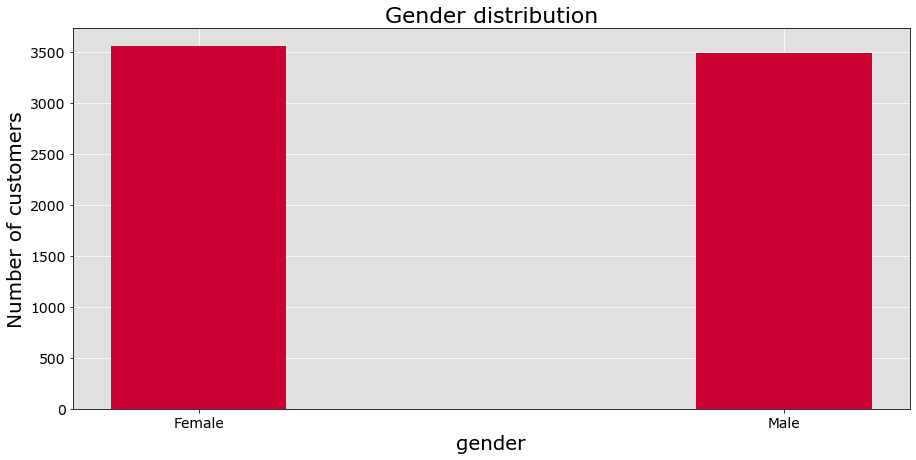

In [5]:
f = plt.figure(figsize=(15,7))
ax = f.add_subplot(1,1,1)
plt.bar(df.gender.unique(),df.gender.value_counts(dropna=False).values,color='#CC0033',width=0.3)
plt.ylabel('Number of customers',fontsize=20)
plt.xlabel('gender',fontsize=20)
plt.yticks(fontsize=14)
plt.xticks(fontsize=14)
plt.grid(color='w')
ax.set_axisbelow(True)
ax.set_facecolor('#E0E0E0')
plt.title('Gender distribution', fontsize=22)


plt.savefig(image_dir+'genderDist.png')

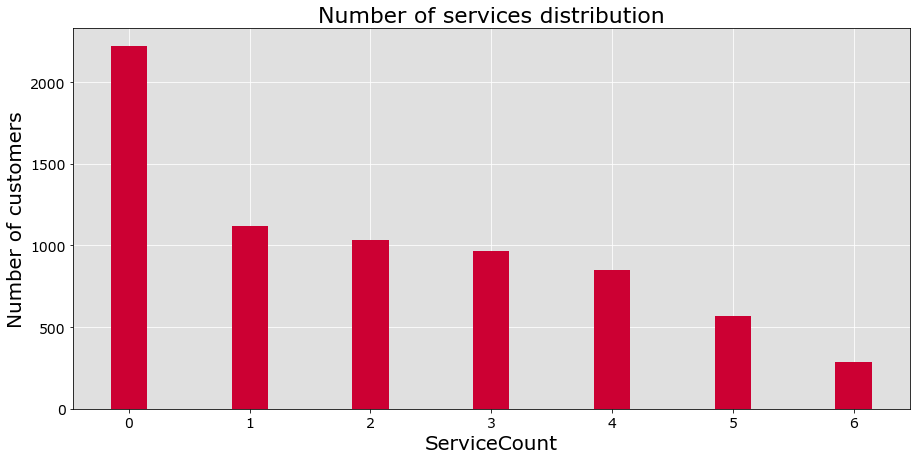

In [6]:
f = plt.figure(figsize=(15,7))
ax = f.add_subplot(1,1,1)
plt.bar(np.arange(7),df.ServiceCount.value_counts(dropna=False).values,color='#CC0033',width=0.3)
plt.ylabel('Number of customers',fontsize=20)
plt.xlabel('ServiceCount',fontsize=20)
plt.yticks(fontsize=14)
plt.xticks(fontsize=14)
plt.grid(color='w')
ax.set_axisbelow(True)
ax.set_facecolor('#E0E0E0')
plt.title('Number of services distribution', fontsize=22)


plt.savefig(image_dir+'ServiceCountDist.png')

In [7]:
df.ServiceCount.unique()

array([1, 2, 3, 0, 4, 5, 6], dtype=int64)

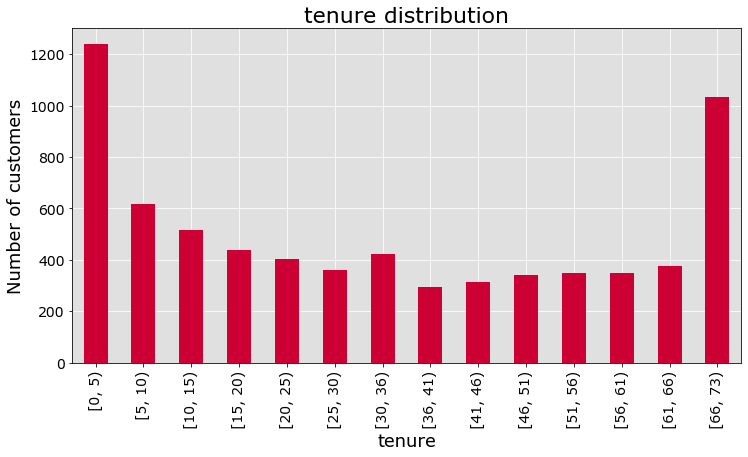

In [9]:
a, b=np.histogram(df['tenure'],bins='sturges')
b=b.astype(int)
b[-1]=b[-1]+1


f = plt.figure(figsize=(12,8))
ax = f.add_subplot(1,1,1)
df.groupby(pd.cut(df['tenure'], b, right=False)).count()['tenure'].plot(kind='bar',color='#CC0033',figsize=(12,8),fontsize=14)
plt.title('tenure distribution', fontsize=22)
plt.ylabel('Number of customers',fontsize=18)
plt.xlabel('tenure',fontsize=18)
plt.grid(color='white')
ax.set_facecolor('#E0E0E0')
ax.set_axisbelow(True)
f.subplots_adjust(bottom=0.3)

plt.savefig(image_dir+'tenure_distribution.png')
plt.show()

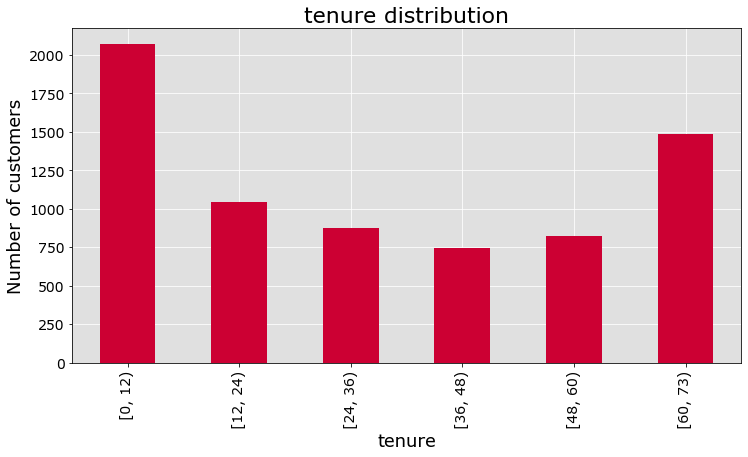

In [11]:
a, b=np.histogram(df['tenure'],bins=6)
b=b.astype(int)
b[-1]=b[-1]+1


f = plt.figure(figsize=(12,8))
ax = f.add_subplot(1,1,1)
df.groupby(pd.cut(df['tenure'], b, right=False)).count()['tenure'].plot(kind='bar',color='#CC0033',figsize=(12,8),fontsize=14)
plt.title('tenure distribution', fontsize=22)
plt.ylabel('Number of customers',fontsize=18)
plt.xlabel('tenure',fontsize=18)
plt.grid(color='white')
ax.set_facecolor('#E0E0E0')
ax.set_axisbelow(True)
f.subplots_adjust(bottom=0.3)

#plt.savefig('tenureyears_distribution.png')
plt.show()

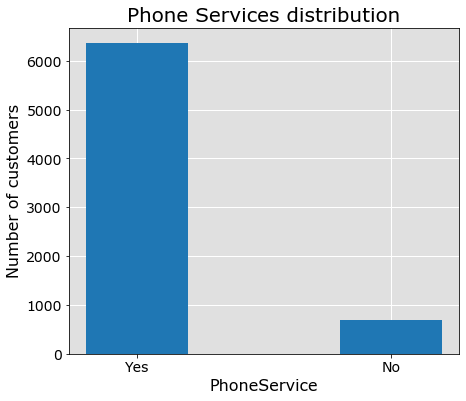

In [12]:
f = plt.figure(figsize=(7,6))
ax = f.add_subplot(1,1,1)
plt.bar(['Yes','No'],df.PhoneService.value_counts(dropna=False).values,width=0.4)
plt.ylabel('Number of customers',fontsize=16)
plt.xlabel('PhoneService',fontsize=16)
plt.yticks(fontsize=14)
plt.xticks(fontsize=14)
plt.grid(color='w', linewidth=1)
ax.set_facecolor('#E0E0E0')
ax.set_axisbelow(True)
plt.title('Phone Services distribution',fontsize=20)
plt.savefig(image_dir+'PhoneServiceDist.png')

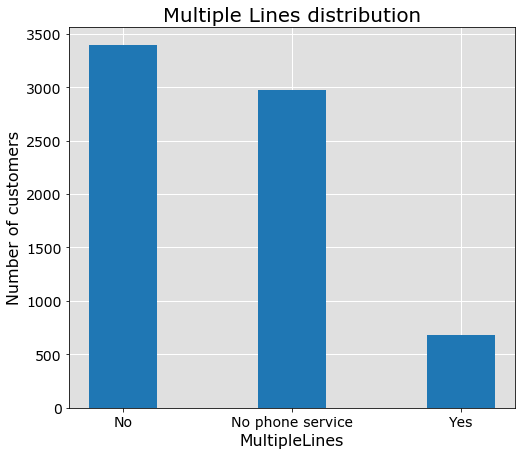

In [13]:
f = plt.figure(figsize=(8,7))
ax = f.add_subplot(1,1,1)
plt.bar(['No','No phone service','Yes'],df.MultipleLines.value_counts(dropna=False).values,width=0.4)
plt.ylabel('Number of customers',fontsize=16)
plt.xlabel('MultipleLines',fontsize=16)
plt.yticks(fontsize=14)
plt.xticks(fontsize=14)
plt.grid(color='r', linestyle='-', linewidth=1)
ax.set_axisbelow(True)
plt.grid(color='w', linewidth=1)
ax.set_facecolor('#E0E0E0')
ax.set_axisbelow(True)
plt.title('Multiple Lines distribution',fontsize=20)
plt.savefig(image_dir+'MultipleLinesDist.png')

In [14]:
df.groupby('MultipleLines').count().gender

MultipleLines
No                  3390
No phone service     682
Yes                 2971
Name: gender, dtype: int64

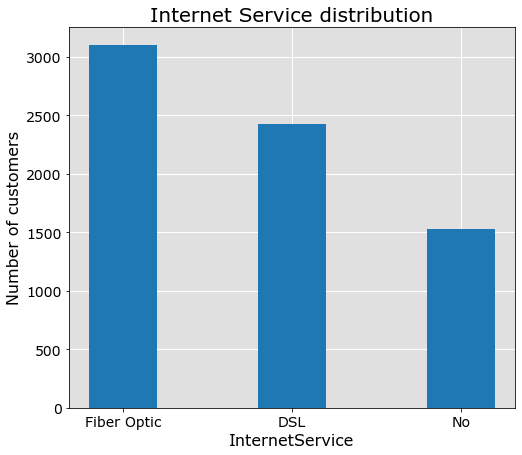

In [15]:
f = plt.figure(figsize=(8,7))
ax = f.add_subplot(1,1,1)
plt.bar(['Fiber Optic','DSL','No'],df.InternetService.value_counts(dropna=False).values,width=0.4)
plt.ylabel('Number of customers',fontsize=16)
plt.xlabel('InternetService',fontsize=16)
plt.yticks(fontsize=14)
plt.xticks(fontsize=14)
plt.grid(color='w', linewidth=1)
ax.set_facecolor('#E0E0E0')
ax.set_axisbelow(True)
plt.title('Internet Service distribution',fontsize=20)
plt.savefig(image_dir+'InternetServiceDist.png')

In [16]:
df.groupby('InternetService').count().gender

InternetService
DSL            2421
Fiber optic    3096
No             1526
Name: gender, dtype: int64

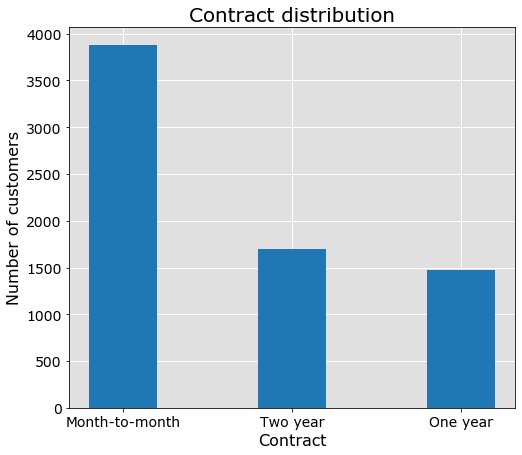

In [17]:
f = plt.figure(figsize=(8,7))
ax = f.add_subplot(1,1,1)
plt.bar(['Month-to-month','Two year','One year'],df.Contract.value_counts(dropna=False).values,width=0.4)
plt.ylabel('Number of customers',fontsize=16)
plt.xlabel('Contract',fontsize=16)
plt.yticks(fontsize=14)
plt.xticks(fontsize=14)
plt.grid(color='w', linewidth=1)
ax.set_facecolor('#E0E0E0')
ax.set_axisbelow(True)
plt.title('Contract distribution',fontsize=20)
plt.savefig(image_dir+'ContractDist.png')

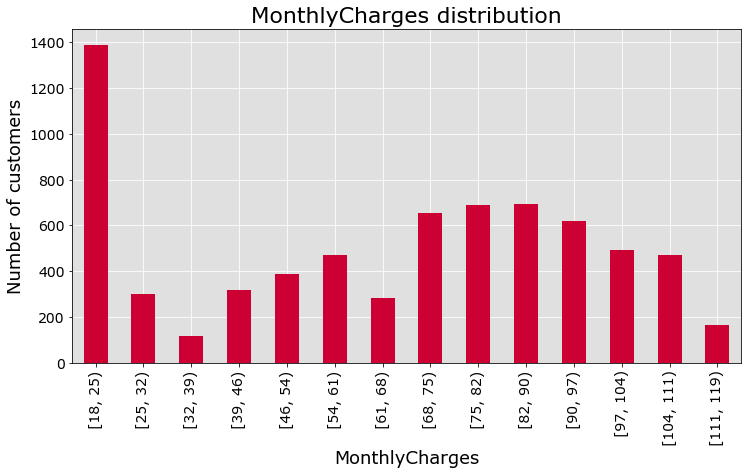

In [18]:
a, b=np.histogram(df['MonthlyCharges'],bins='sturges')
b=b.astype(int)
b[-1]=b[-1]+1


f = plt.figure(figsize=(12,8))
ax = f.add_subplot(1,1,1)
df.groupby(pd.cut(df['MonthlyCharges'], b, right=False)).count()['MonthlyCharges'].plot(kind='bar',color='#CC0033',figsize=(12,8),fontsize=14)
plt.title('MonthlyCharges distribution', fontsize=22)
plt.ylabel('Number of customers',fontsize=18)
plt.xlabel('MonthlyCharges',fontsize=18)
plt.grid(color='white')
ax.set_facecolor('#E0E0E0')
ax.set_axisbelow(True)
f.subplots_adjust(bottom=0.3)

plt.savefig(image_dir+'MonthlyCharges_distribution.png')
plt.show()

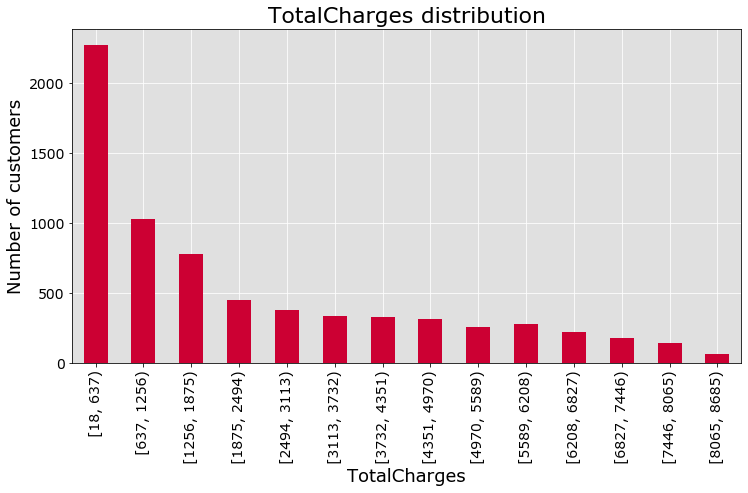

In [19]:
a, b=np.histogram(df['TotalCharges'],bins='sturges')
b=b.astype(int)
b[-1]=b[-1]+1


f = plt.figure(figsize=(12,8))
ax = f.add_subplot(1,1,1)
df.groupby(pd.cut(df['TotalCharges'], b, right=False)).count()['TotalCharges'].plot(kind='bar',color='#CC0033',figsize=(12,8),fontsize=14)
plt.title('TotalCharges distribution', fontsize=22)
plt.ylabel('Number of customers',fontsize=18)
plt.xlabel('TotalCharges',fontsize=18)
plt.grid(color='white')
ax.set_facecolor('#E0E0E0')
ax.set_axisbelow(True)
f.subplots_adjust(bottom=0.3)

plt.savefig(image_dir+'TotalCharges_distribution.png')
plt.show()

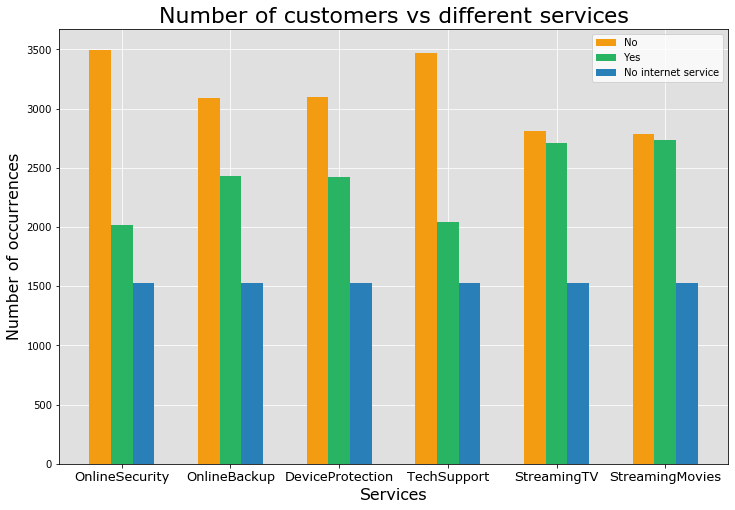

In [21]:
Services=['OnlineSecurity',
'OnlineBackup',
'DeviceProtection',
'TechSupport',
'StreamingTV',
'StreamingMovies']

values=['No','Yes','No internet service']

index=np.array([x for x, _ in enumerate(Services)])

filtr0 = ( df['OnlineSecurity']=='No' )
filtr1= ( df['OnlineSecurity']=='Yes' )
filtr2 = ( df['OnlineSecurity']=='No internet service' )
OnlineSecurity0=df[filtr0].groupby('OnlineSecurity').count().tenure
OnlineSecurity1=df[filtr1].groupby('OnlineSecurity').count().tenure
OnlineSecurity2=df[filtr2].groupby('OnlineSecurity').count().tenure

filtr0 = ( df['OnlineBackup']=='No' )
filtr1= ( df['OnlineBackup']=='Yes' )
filtr2 = ( df['OnlineBackup']=='No internet service' )
OnlineBackup0=df[filtr0].groupby('OnlineBackup').count().tenure
OnlineBackup1=df[filtr1].groupby('OnlineBackup').count().tenure
OnlineBackup2=df[filtr2].groupby('OnlineBackup').count().tenure


filtr0 = ( df['DeviceProtection']=='No' )
filtr1= ( df['DeviceProtection']=='Yes' )
filtr2 = ( df['DeviceProtection']=='No internet service' )
DeviceProtection0=df[filtr0].groupby('DeviceProtection').count().tenure
DeviceProtection1=df[filtr1].groupby('DeviceProtection').count().tenure
DeviceProtection2=df[filtr2].groupby('DeviceProtection').count().tenure

filtr0 = ( df['TechSupport']=='No' )
filtr1= ( df['TechSupport']=='Yes' )
filtr2 = ( df['TechSupport']=='No internet service' )
TechSupport0=df[filtr0].groupby('TechSupport').count().tenure
TechSupport1=df[filtr1].groupby('TechSupport').count().tenure
TechSupport2=df[filtr2].groupby('TechSupport').count().tenure

filtr0 = ( df['StreamingTV']=='No' )
filtr1= ( df['StreamingTV']=='Yes' )
filtr2 = ( df['StreamingTV']=='No internet service' )
StreamingTV0=df[filtr0].groupby('StreamingTV').count().tenure
StreamingTV1=df[filtr1].groupby('StreamingTV').count().tenure
StreamingTV2=df[filtr2].groupby('StreamingTV').count().tenure

filtr0 = ( df['StreamingMovies']=='No' )
filtr1= ( df['StreamingMovies']=='Yes' )
filtr2 = ( df['StreamingMovies']=='No internet service' )
StreamingMovies0=df[filtr0].groupby('StreamingMovies').count().tenure
StreamingMovies1=df[filtr1].groupby('StreamingMovies').count().tenure
StreamingMovies2=df[filtr2].groupby('StreamingMovies').count().tenure

width=0.2
f = plt.figure(figsize=(12,8))
ax = f.add_subplot(1,1,1)


ax.bar(0-width,OnlineSecurity0,width,label='No',align='center',color='#F39C12')
ax.bar(0,OnlineSecurity1,width,label='Yes',align='center',color='#28B463')
ax.bar(0+width,OnlineSecurity2,width,label='No internet service',align='center',color='#2980B9')



ax.bar(1-width,OnlineBackup0,width,label='No',align='center',color='#F39C12')
ax.bar(1,OnlineBackup1,width,label='Yes',align='center',color='#28B463')
ax.bar(1+width,OnlineBackup2,width,label='No internet service',align='center',color='#2980B9')

ax.bar(2-width,DeviceProtection0,width,label='No',align='center',color='#F39C12')
ax.bar(2,DeviceProtection1,width,label='Yes',align='center',color='#28B463')
ax.bar(2+width,DeviceProtection2,width,label='No internet service',align='center',color='#2980B9')

ax.bar(3-width,TechSupport0,width,label='No',align='center',color='#F39C12')
ax.bar(3,TechSupport1,width,label='Yes',align='center',color='#28B463')
ax.bar(3+width,TechSupport2,width,label='No internet service',align='center',color='#2980B9')

ax.bar(4-width,StreamingTV0,width,label='No',align='center',color='#F39C12')
ax.bar(4,StreamingTV1,width,label='Yes',align='center',color='#28B463')
ax.bar(4+width,StreamingTV2,width,label='No internet service',align='center',color='#2980B9')

ax.bar(5-width,StreamingMovies0,width,label='No',align='center',color='#F39C12')
ax.bar(5,StreamingMovies1,width,label='Yes',align='center',color='#28B463')
ax.bar(5+width,StreamingMovies2,width,label='No internet service',align='center',color='#2980B9')


plt.legend(['No','Yes','No internet service'],loc='upper right')
plt.xticks(index,Services,fontsize=13)

plt.ylabel('Number of occurrences',fontsize=16)
plt.xlabel('Services',fontsize=16)
plt.title('Number of customers vs different services',fontsize=22)
plt.grid(color='w')

ax.set_facecolor('#E0E0E0')
ax.set_axisbelow(True)

plt.savefig(image_dir+'Services.png')
plt.show()

In [22]:
df['newTotal']=df.tenure*df.MonthlyCharges

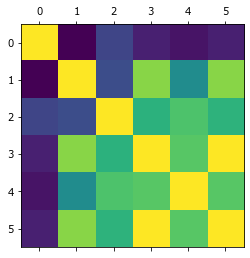

In [24]:
plt.matshow(df.corr())

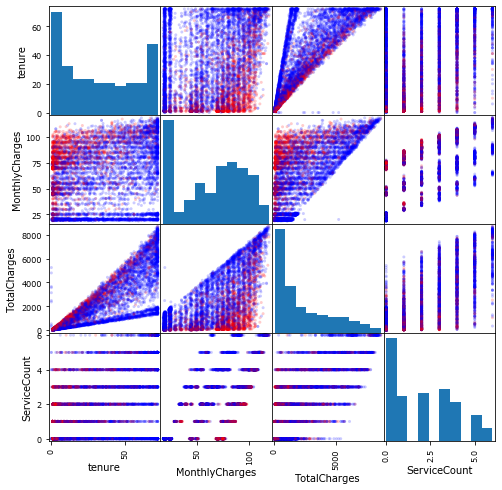

In [25]:
scatter_matrix(df[['tenure','MonthlyCharges','TotalCharges','ServiceCount']], alpha=0.2,figsize=(8,8),color=df.color)
plt.savefig(image_dir+'scatterTarget.png')

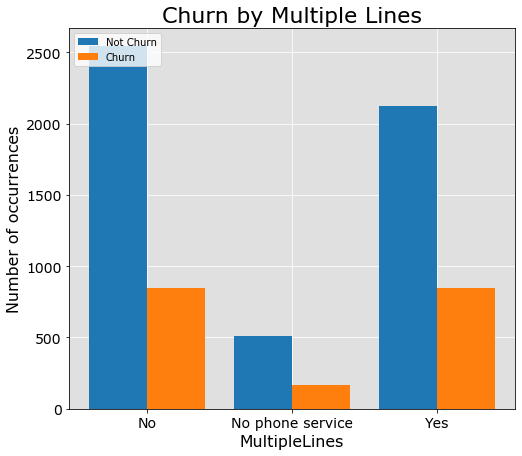

In [26]:
index=np.array([x for x, _ in enumerate(df.MultipleLines.unique())])

filtr = ( df['Churn']=='No' )
MultipleLinesN=df[filtr].groupby('MultipleLines').count().tenure#agg('count')

filtr2 = ( df['Churn']=='Yes' )
MultipleLinesY=df[filtr2].groupby('MultipleLines').count().tenure#agg('count')

width=0.4

f = plt.figure(figsize=(8,7))
ax = f.add_subplot(1,1,1)

ax.bar(index-width/2,MultipleLinesN,width,label='Not Churn')
ax.bar(index+width/2,MultipleLinesY,width,label='Churn')

plt.legend(loc='upper left')
plt.xticks(index,['No','No phone service','Yes'],fontsize=14)
plt.yticks(fontsize=14)

plt.ylabel('Number of occurrences',fontsize=16)
plt.xlabel('MultipleLines',fontsize=16)
plt.title('Churn by Multiple Lines',fontsize=22)

plt.grid(color='w')

ax.set_facecolor('#E0E0E0')
ax.set_axisbelow(True)

plt.savefig(image_dir+'ChurnByMultipleLines.png')
plt.show()

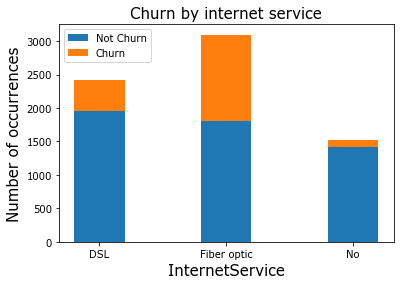

In [27]:
index=np.array([x for x, _ in enumerate(df.InternetService.unique())])

filtr = ( df['Churn']=='No' )
InternetServiceN=df[filtr].groupby('InternetService').count().tenure#agg('count')

filtr2 = ( df['Churn']=='Yes' )
InternetServiceY=df[filtr2].groupby('InternetService').count().tenure#agg('count')

width=0.4

plt.bar(index,InternetServiceN,width,label='Not Churn')

plt.bar(index,InternetServiceY,width,label='Churn',bottom=InternetServiceN)

plt.legend(loc='upper left')
plt.xticks(index,df.InternetService.unique())

plt.ylabel('Number of occurrences',fontsize=15)
plt.xlabel('InternetService',fontsize=15)
plt.title('Churn by internet service',fontsize=15)
plt.savefig(image_dir+'ChurnByInternetService.png')
plt.show()

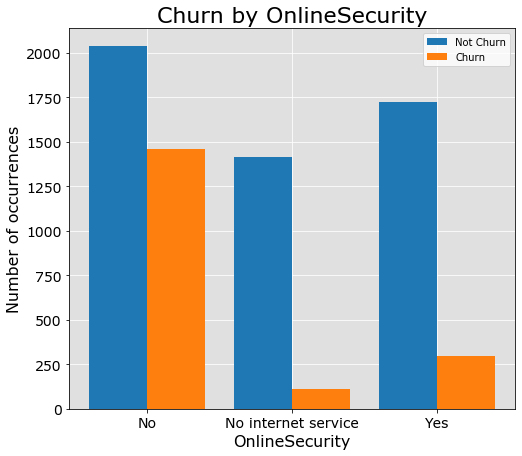

In [28]:
index=np.array([x for x, _ in enumerate(df.OnlineSecurity.unique())])

filtr = ( df['Churn']=='No' )
OnlineSecurityN=df[filtr].groupby('OnlineSecurity').count().tenure#agg('count')

filtr2 = ( df['Churn']=='Yes' )
OnlineSecurityY=df[filtr2].groupby('OnlineSecurity').count().tenure#agg('count')

width=0.4

f = plt.figure(figsize=(8,7))
ax = f.add_subplot(1,1,1)
ax.bar(index-width/2,OnlineSecurityN,width,label='Not Churn')
ax.bar(index+width/2,OnlineSecurityY,width,label='Churn')

plt.legend(loc='upper right')
plt.xticks(index,['No','No internet service','Yes'],fontsize=14)
plt.yticks(fontsize=14)

plt.ylabel('Number of occurrences',fontsize=16)
plt.xlabel('OnlineSecurity',fontsize=16)
plt.title('Churn by OnlineSecurity',fontsize=22)
plt.grid(color='w')

ax.set_facecolor('#E0E0E0')
ax.set_axisbelow(True)


plt.savefig(image_dir+'ChurnByOnlineSecurity.png')
plt.show()

In [29]:
df.Contract.unique()

array(['Month-to-month', 'One year', 'Two year'], dtype=object)

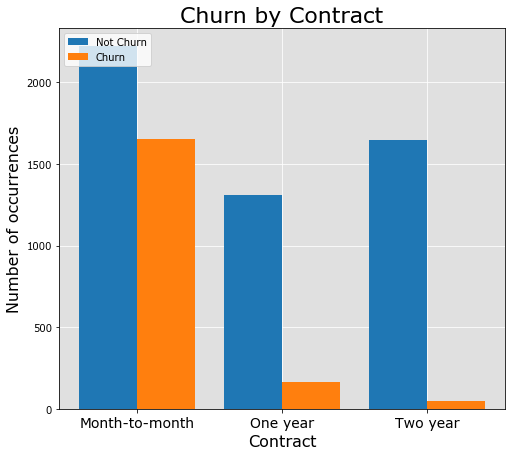

In [30]:
index=np.array([x for x, _ in enumerate(df.Contract.unique())])

filtr = ( df['Churn']=='No' )
ContractN=df[filtr].groupby('Contract').count().tenure#agg('count')

filtr2 = ( df['Churn']=='Yes' )
ContractY=df[filtr2].groupby('Contract').count().tenure#agg('count')


width=0.4
f = plt.figure(figsize=(8,7))
ax = f.add_subplot(1,1,1)
ax.bar(index-width/2,ContractN,width,label='Not Churn')

ax.bar(index+width/2,ContractY,width,label='Churn')

plt.legend(loc='upper left')
plt.xticks(index,df.Contract.unique(),fontsize=14)
plt.xticks(fontsize=14)

plt.ylabel('Number of occurrences',fontsize=16)
plt.xlabel('Contract',fontsize=16)
plt.title('Churn by Contract',fontsize=22)

plt.grid(color='w')

ax.set_facecolor('#E0E0E0')
ax.set_axisbelow(True)

plt.savefig(image_dir+'ChurnByContract.png')
plt.show()

In [31]:
df.groupby('Contract').count().gender

Contract
Month-to-month    3875
One year          1473
Two year          1695
Name: gender, dtype: int64

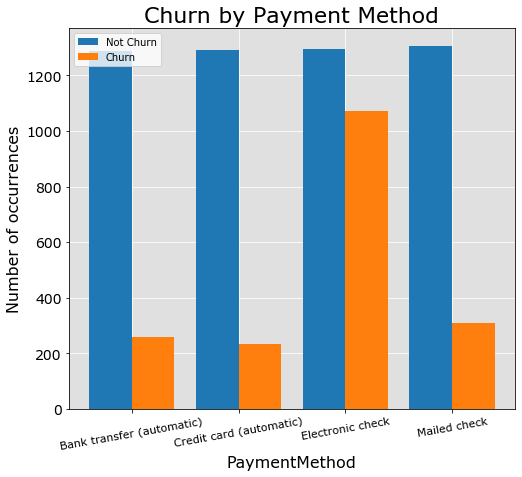

In [32]:
index=np.array([x for x, _ in enumerate(df.PaymentMethod.unique())])

filtr = ( df['Churn']=='No' )
PaymentMethodN=df[filtr].groupby('PaymentMethod').count().tenure

filtr2 = ( df['Churn']=='Yes' )
PaymentMethodY=df[filtr2].groupby('PaymentMethod').count().tenure

width=0.4
f = plt.figure(figsize=(8,7))
ax = f.add_subplot(1,1,1)

ax.bar(index-width/2,PaymentMethodN,width,label='Not Churn')

ax.bar(index+width/2,PaymentMethodY,width,label='Churn')

plt.legend(loc='upper left')
plt.xticks(index,['Bank transfer (automatic)','Credit card (automatic)','Electronic check','Mailed check'],rotation='10',fontsize=11)
plt.yticks(fontsize=14)

plt.ylabel('Number of occurrences',fontsize=16)
plt.xlabel('PaymentMethod',fontsize=16)
plt.title('Churn by Payment Method',fontsize=22)

plt.grid(color='w')
ax.set_facecolor('#E0E0E0')
ax.set_axisbelow(True)

plt.savefig(image_dir+'Churn_by_PaymentMethod.png')
plt.show()




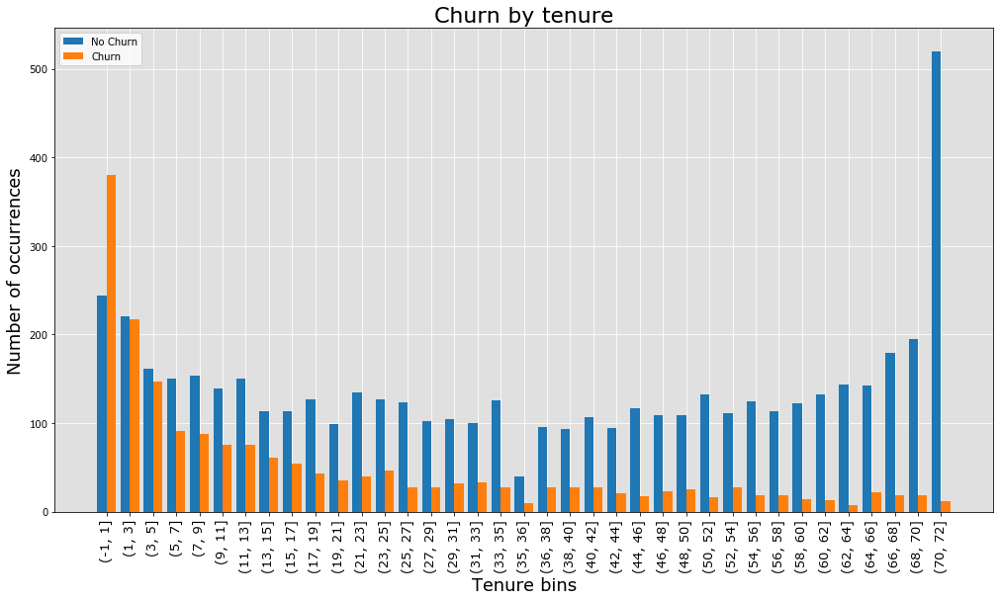

In [34]:
ddf = df
a, b=np.histogram(df['tenure'],bins=37)
b=b.astype(int)

b[0]=b[0]-1

ddf['tenure_bin'] = pd.cut(df['tenure'], b,right=True)
ddf.head()

filtr = ( ddf['Churn']=='No' )
tenureN=ddf[filtr].groupby('tenure_bin').count().gender#agg('count')


filtr2 = ( ddf['Churn']=='Yes' )
tenureY=ddf[filtr2].groupby('tenure_bin').count().gender#agg('count')

index=np.array([x for x, _ in enumerate(tenureN.index)])

fig=plt.figure(figsize=(17,9))
ax = fig.add_subplot(1,1,1)

plt.bar(index-0.2,tenureN,width=0.4,label='no Churn')
plt.bar(index+0.2,tenureY,width=0.4,label='Churn')
plt.legend(loc='upper right')
plt.ylabel('Number of occurrences',fontsize=18)
plt.xlabel('Tenure bins',fontsize=18)
plt.title('Churn by tenure',fontsize=22)
plt.xticks(index,tenureN.index,fontsize=13,rotation='vertical')
plt.grid(color='w')
plt.legend(['No Churn','Churn'],loc='upper left')


ax.set_facecolor('#E0E0E0')
ax.set_axisbelow(True)

plt.savefig(image_dir+'Churn_by_tenure.png')
plt.show()

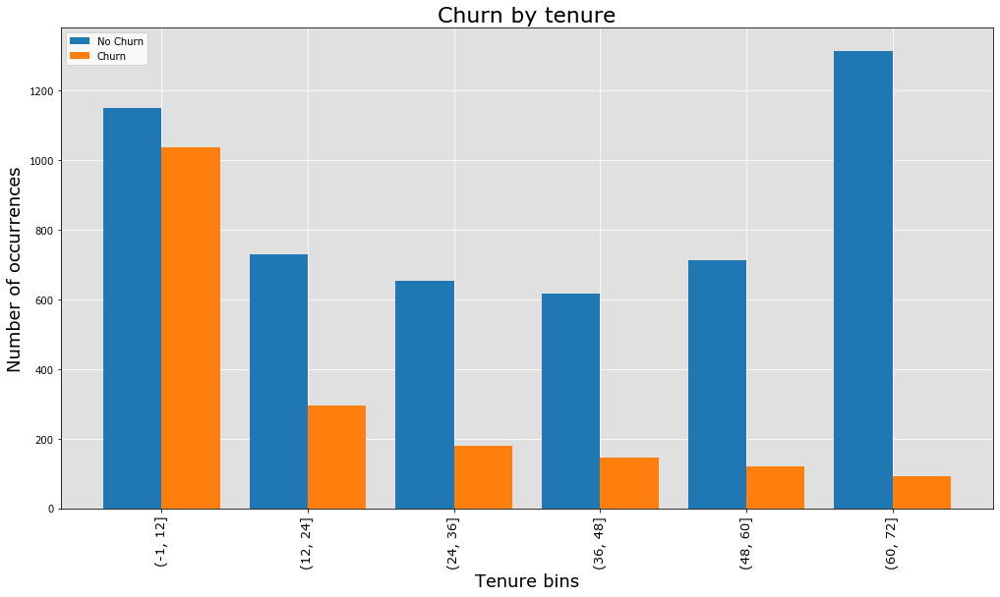

In [35]:
ddf = df
a, b=np.histogram(df['tenure'],bins=6)
b=b.astype(int)

b[0]=b[0]-1

ddf['tenure_bin'] = pd.cut(df['tenure'], b,right=True)
ddf.head()

filtr = ( ddf['Churn']=='No' )
tenureN=ddf[filtr].groupby('tenure_bin').count().gender#agg('count')


filtr2 = ( ddf['Churn']=='Yes' )
tenureY=ddf[filtr2].groupby('tenure_bin').count().gender#agg('count')

index=np.array([x for x, _ in enumerate(tenureN.index)])

fig=plt.figure(figsize=(17,9))
ax = fig.add_subplot(1,1,1)

plt.bar(index-0.2,tenureN,width=0.4,label='no Churn')
plt.bar(index+0.2,tenureY,width=0.4,label='Churn')
plt.legend(loc='upper right')
plt.ylabel('Number of occurrences',fontsize=18)
plt.xlabel('Tenure bins',fontsize=18)
plt.title('Churn by tenure',fontsize=22)
plt.xticks(index,tenureN.index,fontsize=13,rotation='vertical')
plt.grid(color='w')
plt.legend(['No Churn','Churn'],loc='upper left')


ax.set_facecolor('#E0E0E0')
ax.set_axisbelow(True)

plt.savefig(image_dir+'Churn_by_tenure_years.png')
plt.show()

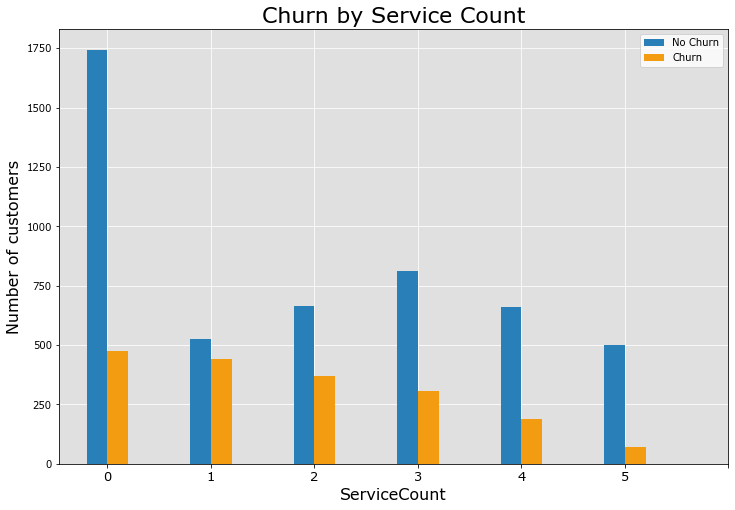

In [40]:
index=np.array([x for x, _ in enumerate(df.ServiceCount.unique())])

Count=np.arange(6)

filtrY = ( df['Churn']=='No' )
filtrN= ( df['Churn']=='Yes' )

ServiceCountN=df[filtrY].groupby('ServiceCount').count().gender
ServiceCountY=df[filtrN].groupby('ServiceCount').count().gender


width=0.2
f = plt.figure(figsize=(12,8))
ax = f.add_subplot(1,1,1)


ax.bar(0-width/2,ServiceCountN[0],width,label='No',align='center',color='#2980B9')
ax.bar(0+width/2,ServiceCountY[0],width,label='Yes',align='center',color='#F39C12')

ax.bar(1-width/2,ServiceCountN[1],width,label='No',align='center',color='#2980B9')
ax.bar(1+width/2,ServiceCountY[1],width,label='Yes',align='center',color='#F39C12')

ax.bar(2-width/2,ServiceCountN[2],width,label='No',align='center',color='#2980B9')
ax.bar(2+width/2,ServiceCountY[2],width,label='Yes',align='center',color='#F39C12')

ax.bar(3-width/2,ServiceCountN[3],width,label='No',align='center',color='#2980B9')
ax.bar(3+width/2,ServiceCountY[3],width,label='Yes',align='center',color='#F39C12')

ax.bar(4-width/2,ServiceCountN[4],width,label='No',align='center',color='#2980B9')
ax.bar(4+width/2,ServiceCountY[4],width,label='Yes',align='center',color='#F39C12')

ax.bar(5-width/2,ServiceCountN[5],width,label='No',align='center',color='#2980B9')
ax.bar(5+width/2,ServiceCountY[5],width,label='Yes',align='center',color='#F39C12')


plt.legend(['No Churn','Churn'],loc='upper right')
plt.xticks(index,Count,fontsize=13)

plt.ylabel('Number of customers',fontsize=16)
plt.xlabel('ServiceCount',fontsize=16)
plt.title('Churn by Service Count',fontsize=22)
plt.grid(color='w')

ax.set_facecolor('#E0E0E0')
ax.set_axisbelow(True)

plt.savefig(image_dir+'ServiceCountChurn.png')
plt.show()

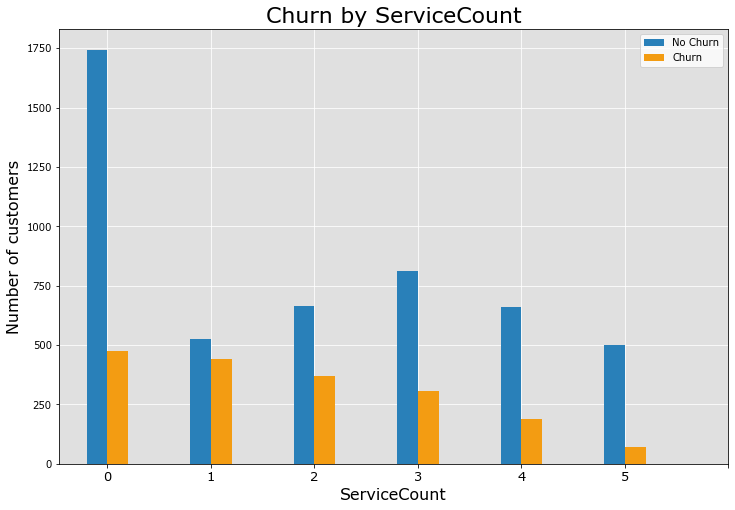

In [41]:
index=np.array([x for x, _ in enumerate(df.ServiceCount.unique())])

Count=np.arange(6)

filtrY = ( df['Churn']=='No' )
filtrN= ( df['Churn']=='Yes' )

ServiceCountN=df[filtrY].groupby('ServiceCount').count().gender
ServiceCountY=df[filtrN].groupby('ServiceCount').count().gender


width=0.2
f = plt.figure(figsize=(12,8))
ax = f.add_subplot(1,1,1)


ax.bar(0-width/2,ServiceCountN[0],width,label='No',align='center',color='#2980B9')
ax.bar(0+width/2,ServiceCountY[0],width,label='Yes',align='center',color='#F39C12')

ax.bar(1-width/2,ServiceCountN[1],width,label='No',align='center',color='#2980B9')
ax.bar(1+width/2,ServiceCountY[1],width,label='Yes',align='center',color='#F39C12')

ax.bar(2-width/2,ServiceCountN[2],width,label='No',align='center',color='#2980B9')
ax.bar(2+width/2,ServiceCountY[2],width,label='Yes',align='center',color='#F39C12')

ax.bar(3-width/2,ServiceCountN[3],width,label='No',align='center',color='#2980B9')
ax.bar(3+width/2,ServiceCountY[3],width,label='Yes',align='center',color='#F39C12')

ax.bar(4-width/2,ServiceCountN[4],width,label='No',align='center',color='#2980B9')
ax.bar(4+width/2,ServiceCountY[4],width,label='Yes',align='center',color='#F39C12')

ax.bar(5-width/2,ServiceCountN[5],width,label='No',align='center',color='#2980B9')
ax.bar(5+width/2,ServiceCountY[5],width,label='Yes',align='center',color='#F39C12')


plt.legend(['No Churn','Churn'],loc='upper right')
plt.xticks(index,Count,fontsize=13)

plt.ylabel('Number of customers',fontsize=16)
plt.xlabel('ServiceCount',fontsize=16)
plt.title('Churn by ServiceCount',fontsize=22)
plt.grid(color='w')

ax.set_facecolor('#E0E0E0')
ax.set_axisbelow(True)

plt.savefig(image_dir+'ServiceCountChurn.png')
plt.show()

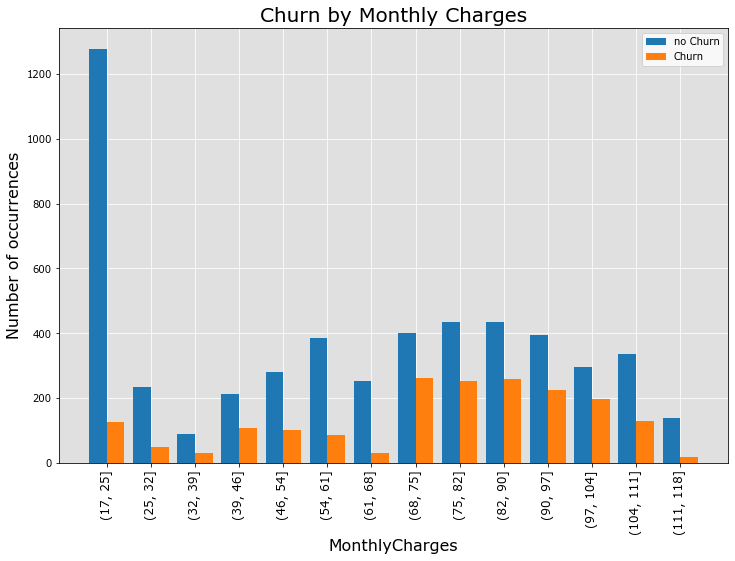

In [45]:
a, b=np.histogram(df['MonthlyCharges'],bins='sturges')
b=b.astype(int)

b[0]=b[0]-1

ddf['MonthlyCharges_bin'] = pd.cut(df['MonthlyCharges'], b)
ddf.head()

filtr = ( ddf['Churn']=='No' )
MonthlyChargesN=ddf[filtr].groupby('MonthlyCharges_bin').count().gender#agg('count')

filtr2 = ( ddf['Churn']=='Yes' )
MonthlyChargesY=ddf[filtr2].groupby('MonthlyCharges_bin').count().gender#agg('count')

index=np.array([x for x, _ in enumerate(MonthlyChargesN.index)])

f = plt.figure(figsize=(12,8))
ax = f.add_subplot(1,1,1)

width=0.4

ax.bar(index-width/2,MonthlyChargesN,label='no Churn',width=width)
ax.bar(index+width/2,MonthlyChargesY,label='Churn',width=width)


ax.grid(color='w')
ax.set_facecolor('#E0E0E0')
ax.set_axisbelow(True)

plt.legend(loc='upper right')
plt.ylabel('Number of occurrences',fontsize=16)
plt.xlabel('MonthlyCharges',fontsize=16)
plt.title('Churn by Monthly Charges',fontsize=20)
plt.xticks(index,MonthlyChargesN.index,fontsize=12,rotation='vertical')
plt.savefig(image_dir+'Churn_by_MonthlyCharges.png')

plt.show()

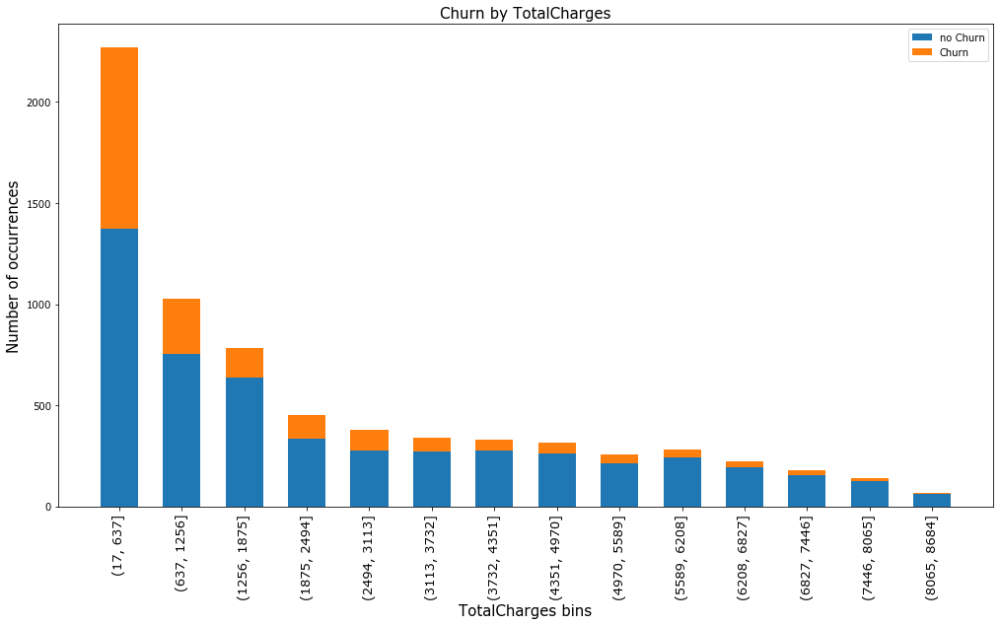

In [46]:
a, b=np.histogram(df['TotalCharges'],bins='sturges')
b=b.astype(int)

b[0]=b[0]-1

ddf['TotalCharges_bin'] = pd.cut(df['TotalCharges'], b)
ddf.head()

filtr = ( ddf['Churn']=='No' )
TotalChargesN=ddf[filtr].groupby('TotalCharges_bin').count().gender#agg('count')

filtr2 = ( ddf['Churn']=='Yes' )
TotalChargesY=ddf[filtr2].groupby('TotalCharges_bin').count().gender#agg('count')

index=np.array([x for x, _ in enumerate(TotalChargesN.index)])

fig=plt.figure(figsize=(17,9))
width=0.6

plt.bar(index,TotalChargesN,width,label='no Churn')
plt.bar(index,TotalChargesY,width,label='Churn',bottom=TotalChargesN)
plt.legend(loc='upper right')
plt.ylabel('Number of occurrences',fontsize=15)
plt.xlabel('TotalCharges bins',fontsize=15)
plt.title('Churn by TotalCharges',fontsize=15)
plt.xticks(index,TotalChargesN.index,fontsize=13,rotation='vertical')
plt.savefig(image_dir+'Churn_by_TotalCharges.png')
plt.show()

In [47]:
df[df.SeniorCitizen==1]['tenure']

20       1
30      71
31       2
34       1
50      43
        ..
7023    63
7029     6
7031    55
7032     1
7041     4
Name: tenure, Length: 1142, dtype: int64

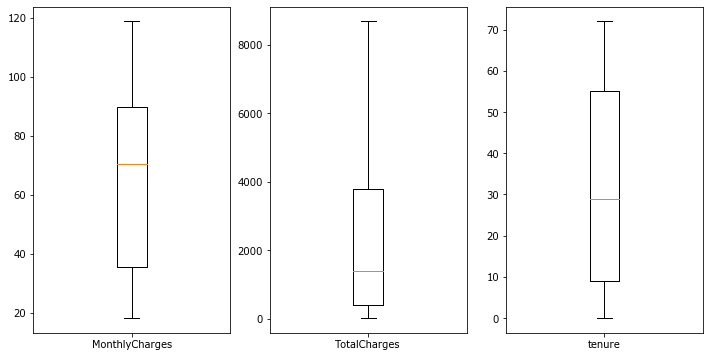

In [48]:
fig=plt.figure(figsize=(12,6))
ax = fig.add_subplot(1,3,1)

#bage = ax.boxplot([df['TotalCharges'],df['MonthlyCharges']],labels=[["TotalCharges"],["MonthlyCharges"]],positions=[1,2])
bage = ax.boxplot(df['MonthlyCharges'],labels=["MonthlyCharges"])

ax = fig.add_subplot(1,3,2)

bage = ax.boxplot(df['TotalCharges'],labels=["TotalCharges"])

ax = fig.add_subplot(1,3,3)

bage = plt.boxplot(df['tenure'],labels=["tenure"])

#plt.boxplot([[1,4],[2,5],[3,6]], positions=[2,4,5.5])

plt.savefig(image_dir+"NumericalAttributes.png")

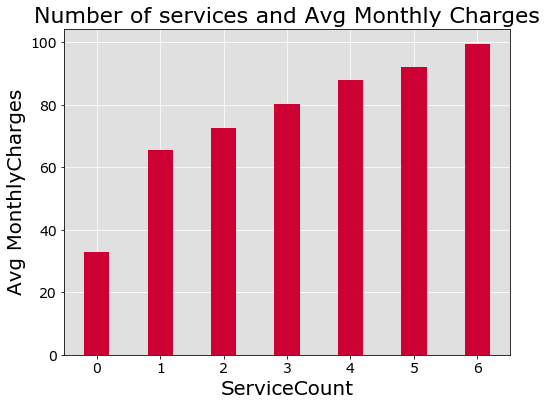

In [49]:
f = plt.figure(figsize=(8,6))
ax = f.add_subplot(1,1,1)
plt.bar(np.arange(7),df.groupby('ServiceCount').MonthlyCharges.mean().values,color='#CC0033',width=0.4)
plt.ylabel('Avg MonthlyCharges',fontsize=20)
plt.xlabel('ServiceCount',fontsize=20)
plt.yticks(fontsize=14)
plt.xticks(fontsize=14)
plt.grid(color='w')
ax.set_axisbelow(True)
ax.set_facecolor('#E0E0E0')
plt.title('Number of services and Avg Monthly Charges', fontsize=22)


plt.savefig(image_dir+'MonthlyChargesServiceCount.png')